# Image Segmentation Techniques

This notebook demonstrates various image segmentation techniques:
1. Global Thresholding
2. Otsu Thresholding
3. Adaptive Thresholding (Mean & Gaussian)
4. Sobel Edge Detection
5. Canny Edge Detection

In [40]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


Loading medical images from: c:\Users\praan\Desktop\pvlab\lab4\medical_images
✓ Loaded: medical_image1.jpg
✓ Loaded: medical_images2.jpg
✓ Loaded: medical_images3.jpeg

✓ Total images loaded: 3


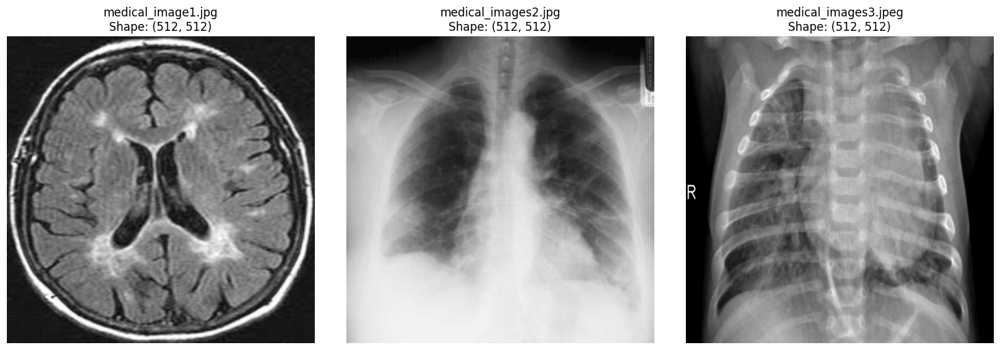

In [ ]:
# Load medical images from local directory
import os
import glob

def load_medical_images():
    medical_images = []
    image_names = []
    
    # Define the directory where medical images are stored
    # You can place your downloaded images in this folder
    image_dir = os.path.join(os.getcwd(), 'medical_images')
    
    # Create directory if it doesn't exist
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
        print(f"Created directory: {image_dir}")
        print("Please place your medical images in this folder and run again.")
    
    # Supported image formats
    image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tif', '*.tiff']
    
    # Load all images from the directory
    print(f"Loading medical images from: {image_dir}")
    
    for ext in image_extensions:
        for img_path in glob.glob(os.path.join(image_dir, ext)):
            try:
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                
                if img is not None:
                    # Resize for consistency
                    img = cv2.resize(img, (512, 512))
                    medical_images.append(img)
                    image_names.append(os.path.basename(img_path))
                    print(f"✓ Loaded: {os.path.basename(img_path)}")
            except Exception as e:
                print(f"✗ Could not load {os.path.basename(img_path)}: {str(e)[:50]}")
    
    # If no images loaded from directory, use built-in samples
    if len(medical_images) == 0:
        print("\n⚠️ No images found in the medical_images directory.")
        print("Using sample medical-like images for demonstration...\n")
        
        # Create sample medical-like images
        img1 = np.random.randint(0, 256, (512, 512), dtype=np.uint8)
        img1 = cv2.GaussianBlur(img1, (15, 15), 0)
        cv2.circle(img1, (256, 256), 100, 200, -1)
        cv2.circle(img1, (256, 256), 120, 150, 10)
        
        img2 = np.zeros((512, 512), dtype=np.uint8)
        cv2.ellipse(img2, (256, 256), (150, 200), 0, 0, 360, 180, -1)
        cv2.rectangle(img2, (200, 150), (312, 350), 220, -1)
        
        img3 = np.random.randint(30, 180, (512, 512), dtype=np.uint8)
        cv2.circle(img3, (256, 256), 150, 250, -1)
        cv2.circle(img3, (200, 200), 50, 100, -1)
        
        img4 = np.random.randint(50, 200, (512, 512), dtype=np.uint8)
        cv2.rectangle(img4, (150, 150), (362, 362), 250, -1)
        cv2.circle(img4, (256, 256), 80, 100, -1)
        
        medical_images = [img1, img2, img3, img4]
        image_names = ['Sample Medical 1', 'Sample Medical 2', 'Sample Medical 3', 'Sample Medical 4']
    
    return medical_images, image_names

# Load the medical images
medical_images, image_names = load_medical_images()

print(f"\n✓ Total images loaded: {len(medical_images)}")

# Display all loaded medical images
num_images = len(medical_images)
cols = min(4, num_images)
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(20, 8 * rows))
for i, (img, name) in enumerate(zip(medical_images, image_names)):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{name}\nShape: {img.shape}')
    plt.axis('off')
plt.tight_layout()
plt.show()

## 1. Global Thresholding

Global thresholding applies a fixed threshold value to the entire image. Pixels with intensity greater than the threshold are set to maximum value (255), others to 0.

## Understanding Thresholding with Histograms

A **histogram** shows the distribution of pixel intensities (0-255) in an image. 
- X-axis: Pixel intensity values (0=black, 255=white)
- Y-axis: Number of pixels with that intensity

Thresholding divides the histogram into two regions: background and foreground.

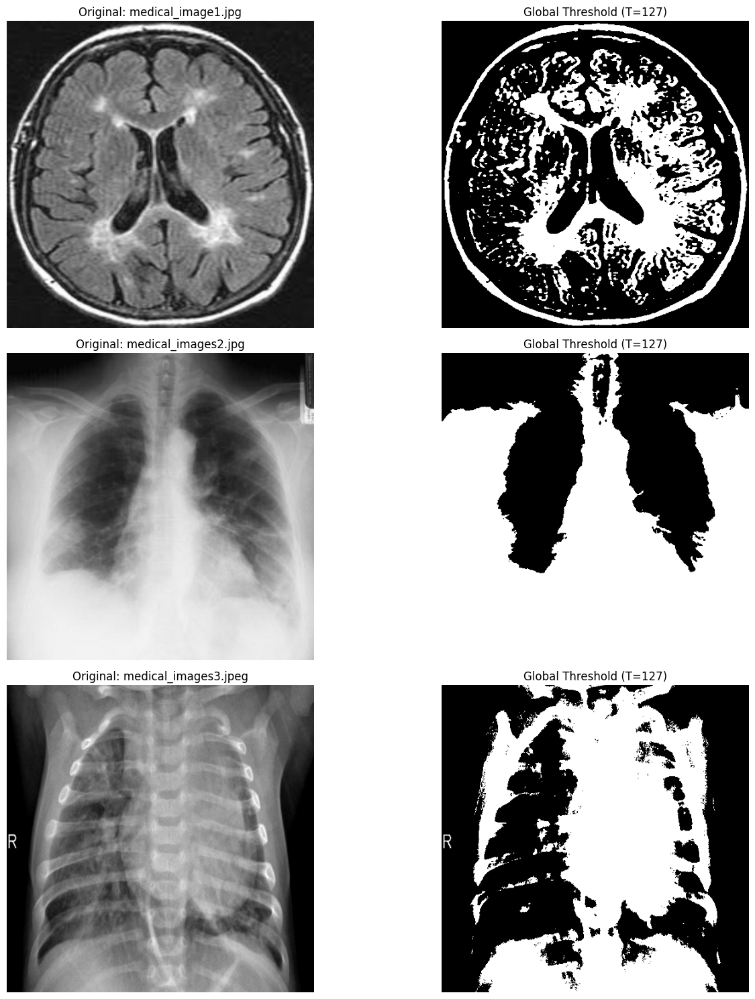

Global thresholding completed for 3 images
Threshold value used: 127


In [ ]:
# Global Thresholding on all medical images
threshold_value = 127  # You can adjust this value

# Apply global thresholding to all images
global_thresh_results = []
for img in medical_images:
    ret, global_thresh = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)
    global_thresh_results.append(global_thresh)

# Display results
num_images = len(medical_images)
plt.figure(figsize=(20, 8 * num_images))

for i, (img, result, name) in enumerate(zip(medical_images, global_thresh_results, image_names)):
    plt.subplot(num_images, 2, i * 2 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original: {name}')
    plt.axis('off')
    
    plt.subplot(num_images, 2, i * 2 + 2)
    plt.imshow(result, cmap='gray')
    plt.title(f'Global Threshold (T={threshold_value})')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Global thresholding completed for {num_images} images")
print(f"Threshold value used: {threshold_value}")

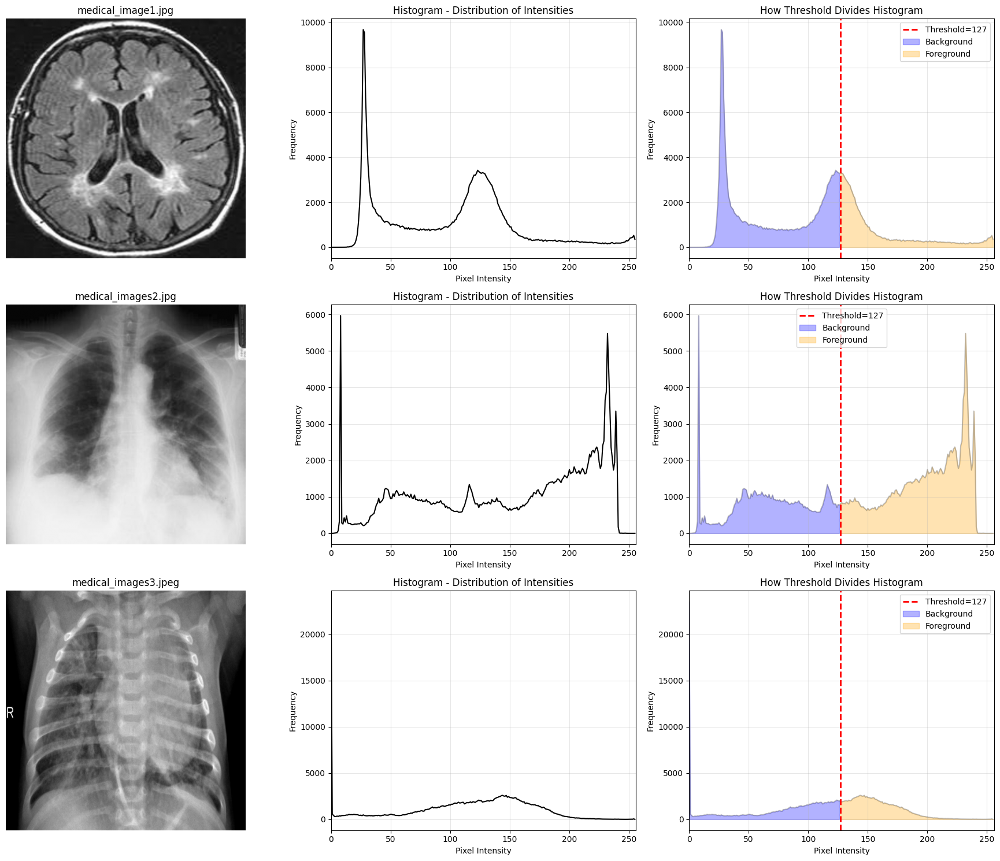

Histogram shows pixel intensity distribution
Red line at 127 shows where we split background vs foreground


In [ ]:
# Visualize histograms to understand how we choose thresholds
plt.figure(figsize=(24, 8 * num_images))

for i, (img, name) in enumerate(zip(medical_images, image_names)):
    # Calculate histogram
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    
    plt.subplot(num_images, 3, i * 3 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{name}')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 2)
    plt.plot(hist, color='black')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Histogram - Distribution of Intensities')
    plt.xlim([0, 256])
    plt.grid(True, alpha=0.3)
    
    plt.subplot(num_images, 3, i * 3 + 3)
    plt.plot(hist, color='gray', alpha=0.5)
    plt.axvline(x=127, color='red', linestyle='--', linewidth=2, label='Threshold=127')
    plt.fill_between(range(0, 127), 0, hist[:127].flatten(), alpha=0.3, color='blue', label='Background')
    plt.fill_between(range(127, 256), 0, hist[127:].flatten(), alpha=0.3, color='orange', label='Foreground')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('How Threshold Divides Histogram')
    plt.xlim([0, 256])
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Histogram shows pixel intensity distribution")
print("Red line at 127 shows where we split background vs foreground")

## 2. Otsu Thresholding

Otsu's method automatically determines the optimal threshold value by minimizing intra-class variance (or maximizing inter-class variance).

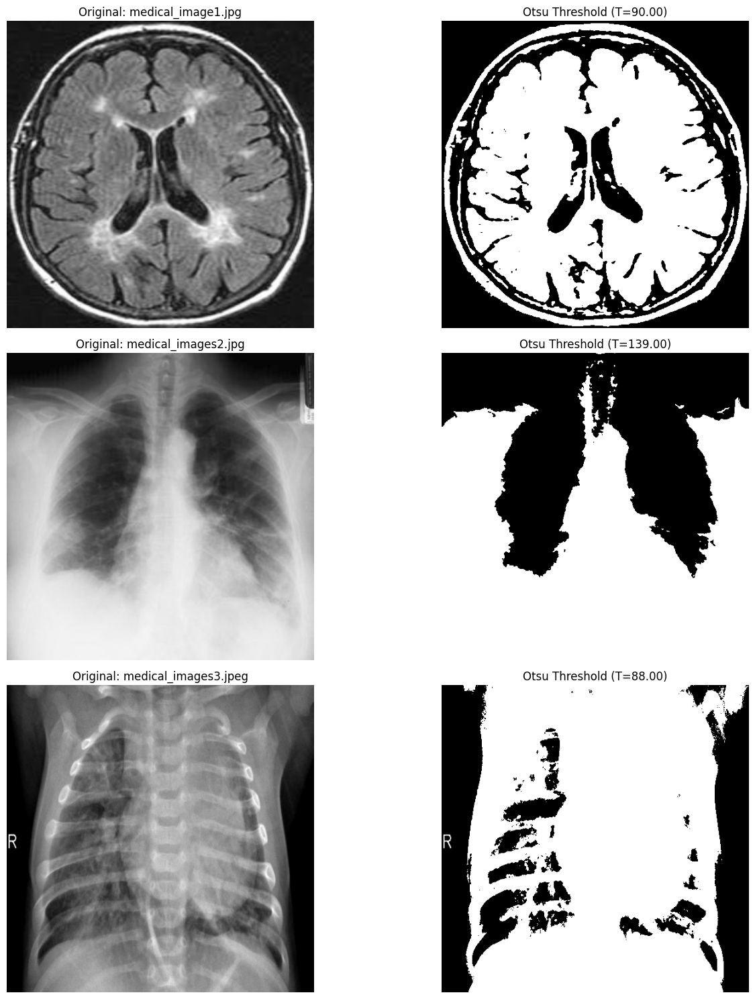

Otsu thresholding completed for 3 images
  medical_image1.jpg: Optimal threshold = 90.00
  medical_images2.jpg: Optimal threshold = 139.00
  medical_images3.jpeg: Optimal threshold = 88.00


In [ ]:
# Otsu Thresholding on all medical images
# Apply Otsu's thresholding to all images
otsu_thresh_results = []
otsu_thresholds = []

for img in medical_images:
    otsu_threshold, otsu_thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    otsu_thresh_results.append(otsu_thresh)
    otsu_thresholds.append(otsu_threshold)

# Display results
plt.figure(figsize=(20, 8 * num_images))

for i, (img, result, threshold, name) in enumerate(zip(medical_images, otsu_thresh_results, otsu_thresholds, image_names)):
    plt.subplot(num_images, 2, i * 2 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original: {name}')
    plt.axis('off')
    
    plt.subplot(num_images, 2, i * 2 + 2)
    plt.imshow(result, cmap='gray')
    plt.title(f'Otsu Threshold (T={threshold:.2f})')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Otsu thresholding completed for {num_images} images")
for i, (name, threshold) in enumerate(zip(image_names, otsu_thresholds)):
    print(f"  {name}: Optimal threshold = {threshold:.2f}")

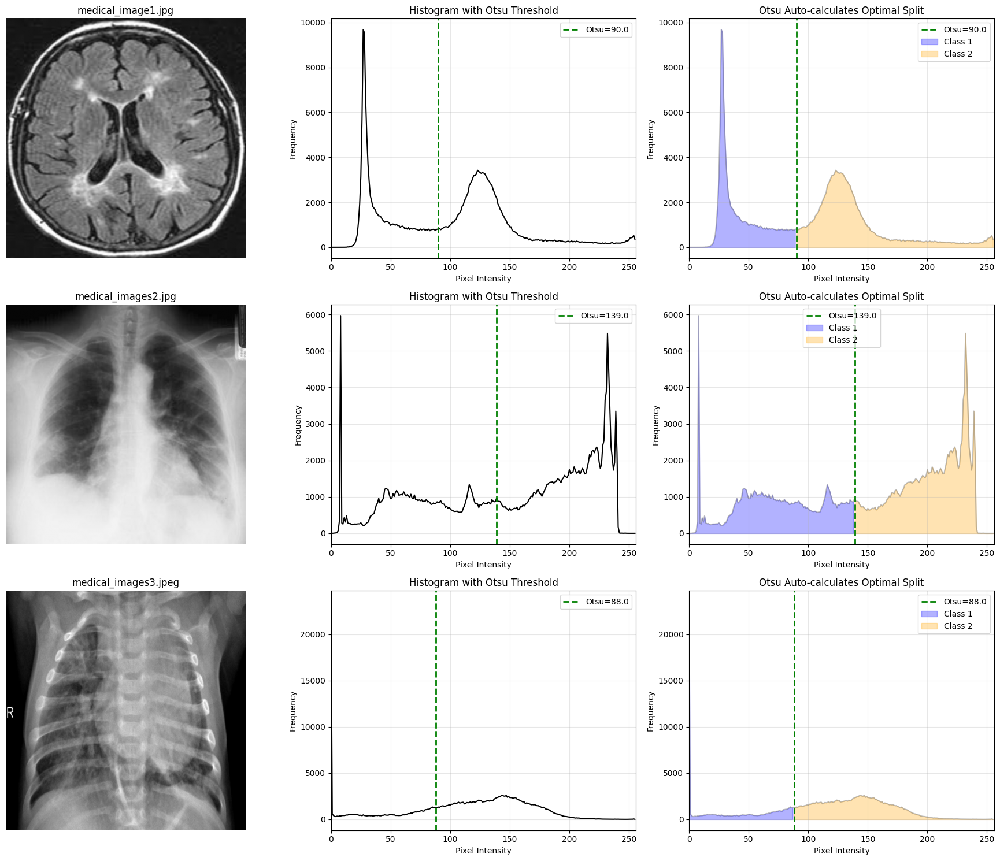

Otsu's Method automatically finds the BEST threshold
It minimizes variance within each class (blue & orange)
Otsu threshold values: ['90.00', '139.00', '88.00']


In [ ]:
# Histogram showing Otsu's automatic threshold calculation
plt.figure(figsize=(24, 8 * num_images))

for i, (img, name, otsu_val) in enumerate(zip(medical_images, image_names, otsu_thresholds)):
    # Calculate histogram
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    
    plt.subplot(num_images, 3, i * 3 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{name}')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 2)
    plt.plot(hist, color='black')
    plt.axvline(x=otsu_val, color='green', linestyle='--', linewidth=2, label=f'Otsu={otsu_val:.1f}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title(f'Histogram with Otsu Threshold')
    plt.xlim([0, 256])
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.subplot(num_images, 3, i * 3 + 3)
    plt.plot(hist, color='gray', alpha=0.5)
    plt.axvline(x=otsu_val, color='green', linestyle='--', linewidth=2, label=f'Otsu={otsu_val:.1f}')
    plt.fill_between(range(0, int(otsu_val)), 0, hist[:int(otsu_val)].flatten(), alpha=0.3, color='blue', label='Class 1')
    plt.fill_between(range(int(otsu_val), 256), 0, hist[int(otsu_val):].flatten(), alpha=0.3, color='orange', label='Class 2')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Otsu Auto-calculates Optimal Split')
    plt.xlim([0, 256])
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Otsu's Method automatically finds the BEST threshold")
print("It minimizes variance within each class (blue & orange)")
print("Otsu threshold values:", [f"{t:.2f}" for t in otsu_thresholds])

## 3. Adaptive Thresholding

Adaptive thresholding calculates the threshold for small regions of the image. This is useful for images with varying illumination conditions. It uses two methods:
- **Mean**: Threshold is the mean of the neighborhood area
- **Gaussian**: Threshold is a weighted sum (Gaussian window) of neighborhood values

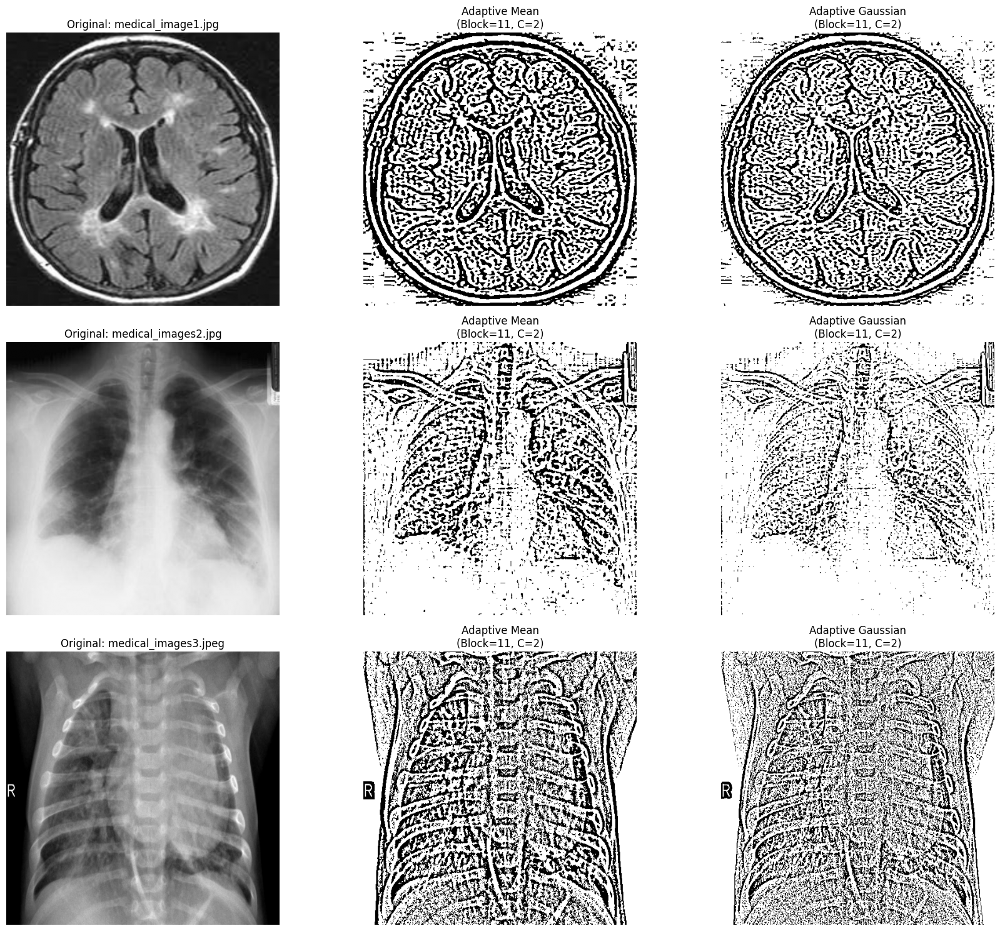

Adaptive thresholding completed for 3 images
Block size: 11, Constant (C): 2


In [ ]:
# Adaptive Thresholding on all medical images
# Apply adaptive thresholding to all images
adaptive_thresh_results = []

for img in medical_images:
    # Adaptive Mean Thresholding
    adaptive_mean = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                          cv2.THRESH_BINARY, 11, 2)
    
    # Adaptive Gaussian Thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                              cv2.THRESH_BINARY, 11, 2)
    
    adaptive_thresh_results.append({
        'mean': adaptive_mean,
        'gaussian': adaptive_gaussian
    })

# Display results
plt.figure(figsize=(24, 8 * num_images))

for i, (img, result, name) in enumerate(zip(medical_images, adaptive_thresh_results, image_names)):
    plt.subplot(num_images, 3, i * 3 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original: {name}')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 2)
    plt.imshow(result['mean'], cmap='gray')
    plt.title('Adaptive Mean\n(Block=11, C=2)')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 3)
    plt.imshow(result['gaussian'], cmap='gray')
    plt.title('Adaptive Gaussian\n(Block=11, C=2)')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Adaptive thresholding completed for {num_images} images")
print("Block size: 11, Constant (C): 2")

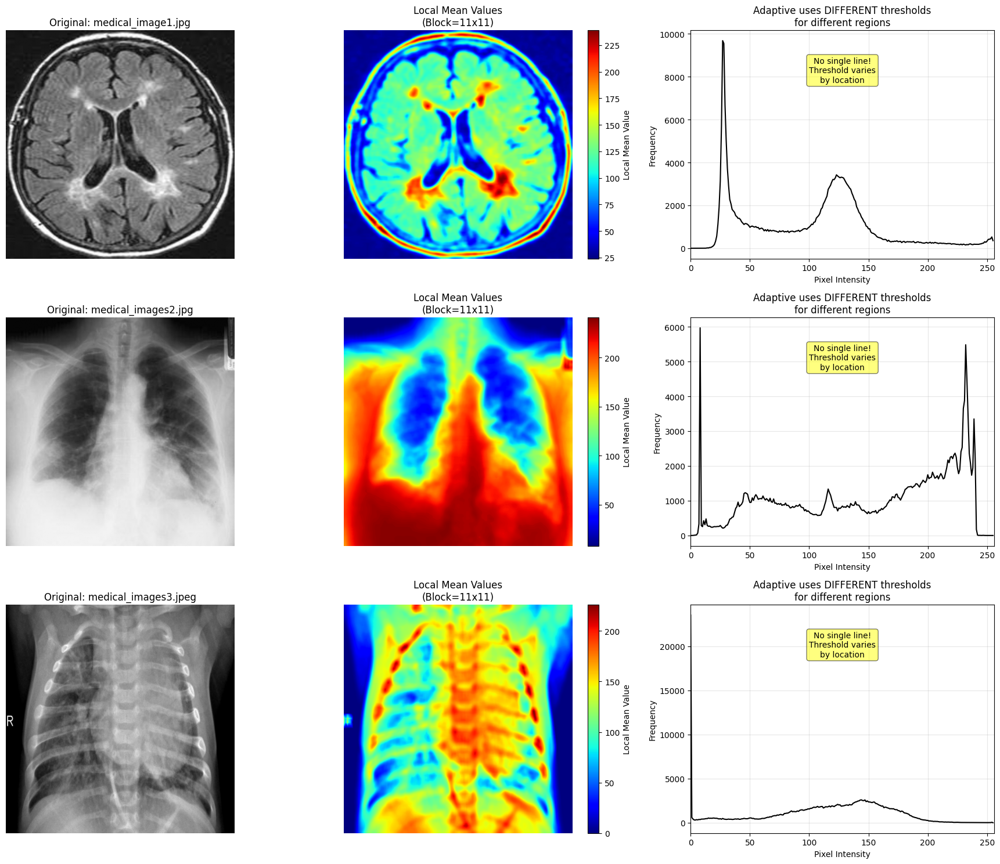

Adaptive Thresholding uses LOCAL statistics
Different parts of the image get different thresholds
Perfect for images with varying brightness!


In [ ]:
# Visualize how Adaptive Thresholding uses LOCAL regions
# Show different threshold values across the image
plt.figure(figsize=(24, 8 * num_images))

for i, (img, name) in enumerate(zip(medical_images, image_names)):
    # For demonstration, calculate local mean for visualization
    # Divide image into regions and show local statistics
    block_size = 11
    
    plt.subplot(num_images, 3, i * 3 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original: {name}')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 2)
    # Show local mean (what adaptive threshold uses)
    local_mean = cv2.blur(img, (block_size, block_size))
    plt.imshow(local_mean, cmap='jet')
    plt.colorbar(label='Local Mean Value')
    plt.title(f'Local Mean Values\n(Block={block_size}x{block_size})')
    plt.axis('off')
    
    plt.subplot(num_images, 3, i * 3 + 3)
    # Calculate histogram
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    plt.plot(hist, color='black')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Adaptive uses DIFFERENT thresholds\nfor different regions')
    plt.xlim([0, 256])
    plt.grid(True, alpha=0.3)
    # Add annotation
    plt.text(128, max(hist)*0.8, 'No single line!\nThreshold varies\nby location', 
             ha='center', fontsize=10, bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))

plt.tight_layout()
plt.show()

print("Adaptive Thresholding uses LOCAL statistics")
print("Different parts of the image get different thresholds")
print("Perfect for images with varying brightness!")

## 4. Sobel Edge Detection

Sobel operator detects edges by computing the gradient of the image intensity. It uses two 3x3 kernels to calculate gradients in horizontal (x) and vertical (y) directions.

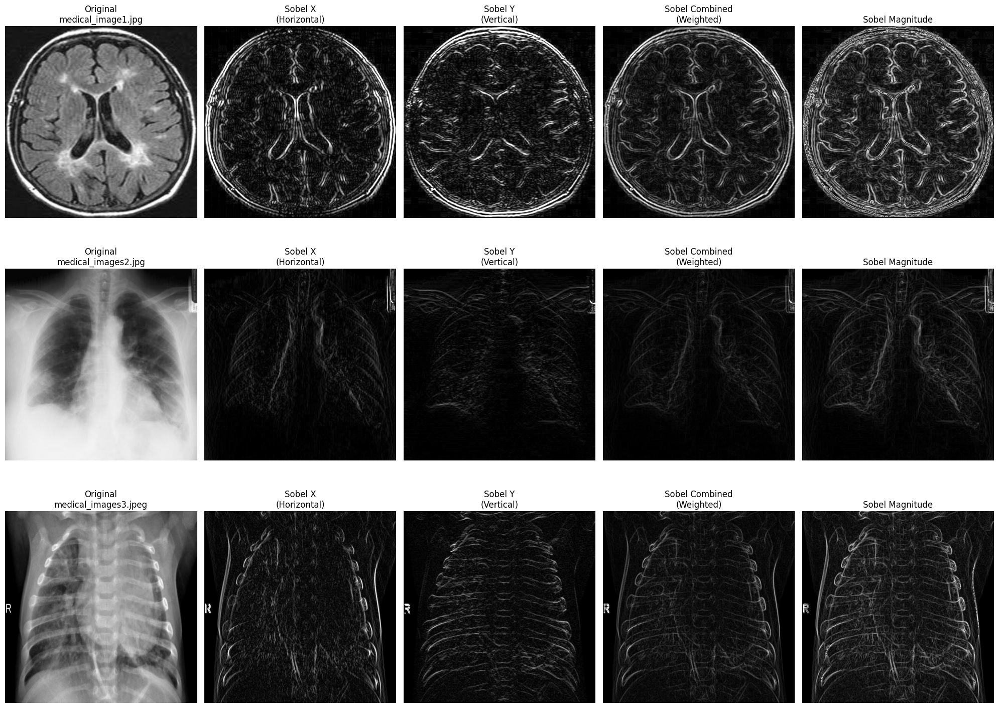

Sobel edge detection completed for 3 images


In [ ]:
# Sobel Edge Detection on all medical images
sobel_results = []

for img in medical_images:
    # Calculate gradients in x and y directions
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate the magnitude of gradients
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_magnitude = np.uint8(sobel_magnitude)
    
    # Convert to absolute values for better visualization
    sobel_x_abs = cv2.convertScaleAbs(sobel_x)
    sobel_y_abs = cv2.convertScaleAbs(sobel_y)
    sobel_combined = cv2.addWeighted(sobel_x_abs, 0.5, sobel_y_abs, 0.5, 0)
    
    sobel_results.append({
        'x': sobel_x_abs,
        'y': sobel_y_abs,
        'combined': sobel_combined,
        'magnitude': sobel_magnitude
    })

# Display results
plt.figure(figsize=(28, 8 * num_images))

for i, (img, result, name) in enumerate(zip(medical_images, sobel_results, image_names)):
    plt.subplot(num_images, 5, i * 5 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original\n{name}')
    plt.axis('off')
    
    plt.subplot(num_images, 5, i * 5 + 2)
    plt.imshow(result['x'], cmap='gray')
    plt.title('Sobel X\n(Horizontal)')
    plt.axis('off')
    
    plt.subplot(num_images, 5, i * 5 + 3)
    plt.imshow(result['y'], cmap='gray')
    plt.title('Sobel Y\n(Vertical)')
    plt.axis('off')
    
    plt.subplot(num_images, 5, i * 5 + 4)
    plt.imshow(result['combined'], cmap='gray')
    plt.title('Sobel Combined\n(Weighted)')
    plt.axis('off')
    
    plt.subplot(num_images, 5, i * 5 + 5)
    plt.imshow(result['magnitude'], cmap='gray')
    plt.title('Sobel Magnitude')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Sobel edge detection completed for {num_images} images")

## Edge Detection vs Thresholding

**Key Difference:**
- **Thresholding**: Uses histogram (pixel intensity values) to separate regions
- **Edge Detection**: Uses gradients (rate of change) to find boundaries

Edge detection doesn't use histograms - it looks for rapid changes in intensity!

## 5. Canny Edge Detection

Canny edge detection is a multi-stage algorithm that includes noise reduction, gradient calculation, non-maximum suppression, and edge tracking by hysteresis.

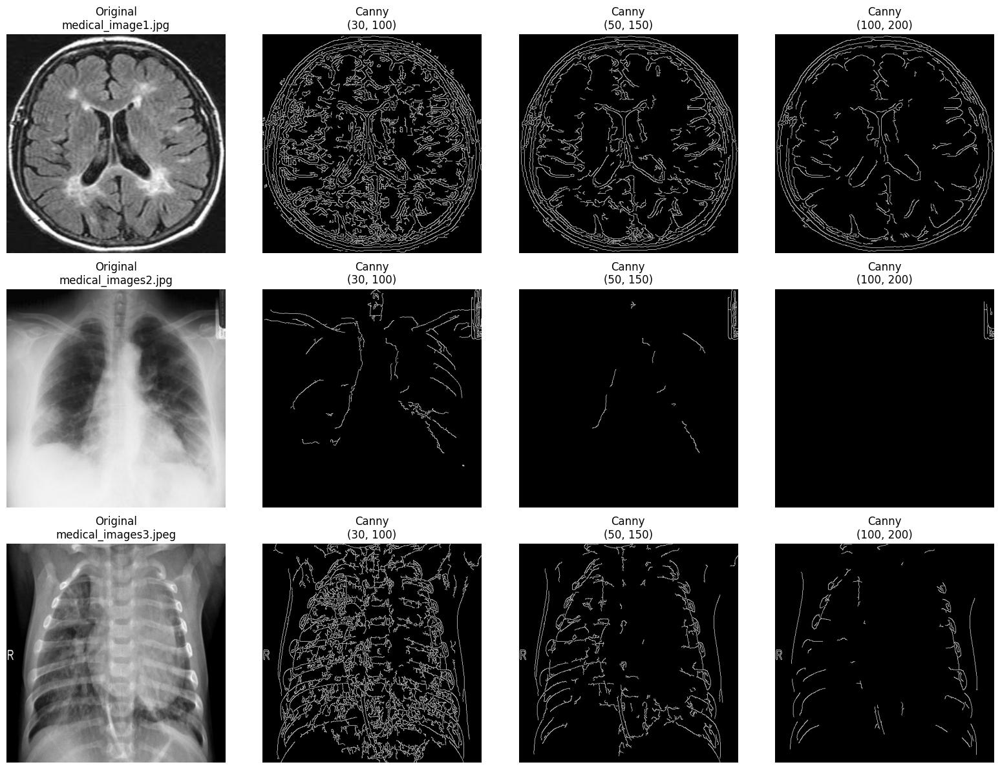

Canny edge detection completed for 3 images
Thresholds tested: (30, 100), (50, 150), (100, 200)


In [ ]:
# Canny Edge Detection on all medical images
low_threshold = 50
high_threshold = 150

canny_results = []

for img in medical_images:
    # Apply Canny edge detection with different threshold values
    canny_low = cv2.Canny(img, 30, 100)
    canny_medium = cv2.Canny(img, 50, 150)
    canny_high = cv2.Canny(img, 100, 200)
    
    canny_results.append({
        'low': canny_low,
        'medium': canny_medium,
        'high': canny_high
    })

# Display results
plt.figure(figsize=(24, 8 * num_images))

for i, (img, result, name) in enumerate(zip(medical_images, canny_results, image_names)):
    plt.subplot(num_images, 4, i * 4 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original\n{name}')
    plt.axis('off')
    
    plt.subplot(num_images, 4, i * 4 + 2)
    plt.imshow(result['low'], cmap='gray')
    plt.title('Canny\n(30, 100)')
    plt.axis('off')
    
    plt.subplot(num_images, 4, i * 4 + 3)
    plt.imshow(result['medium'], cmap='gray')
    plt.title('Canny\n(50, 150)')
    plt.axis('off')
    
    plt.subplot(num_images, 4, i * 4 + 4)
    plt.imshow(result['high'], cmap='gray')
    plt.title('Canny\n(100, 200)')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Canny edge detection completed for {num_images} images")
print(f"Thresholds tested: (30, 100), (50, 150), (100, 200)")

## Comparison of All Techniques

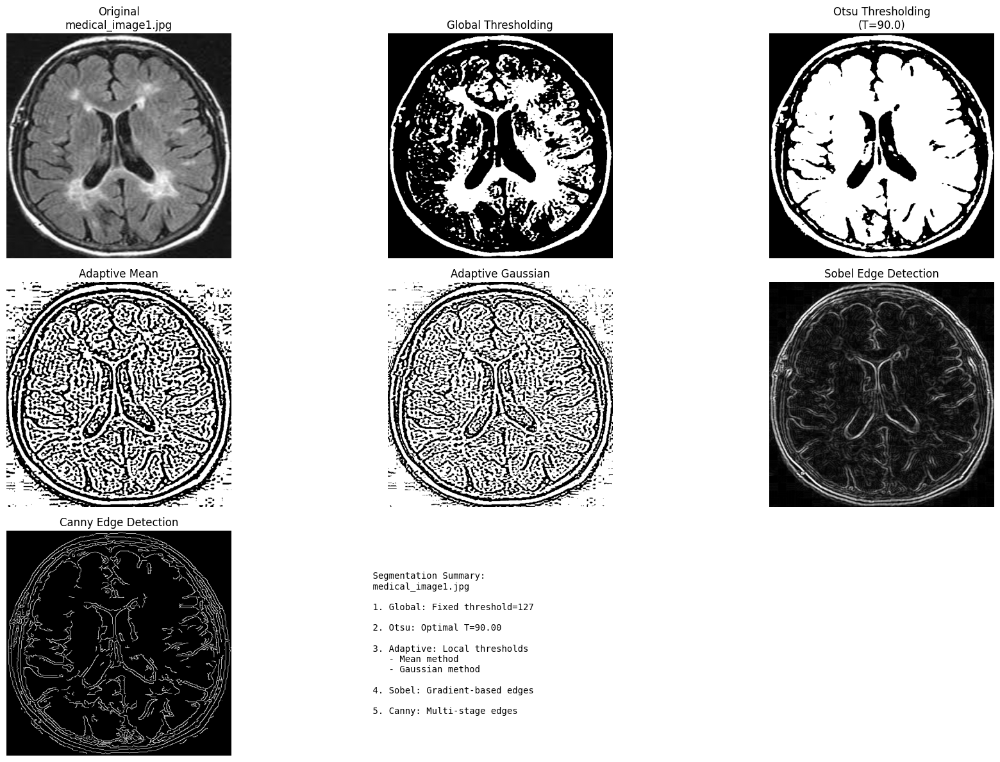

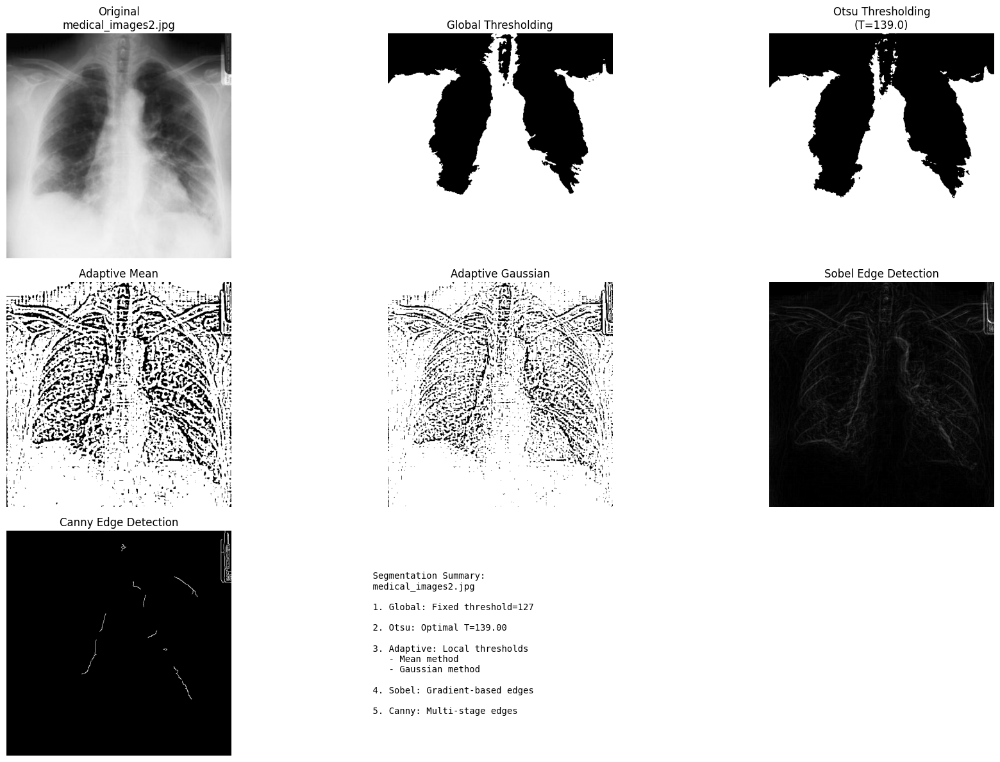

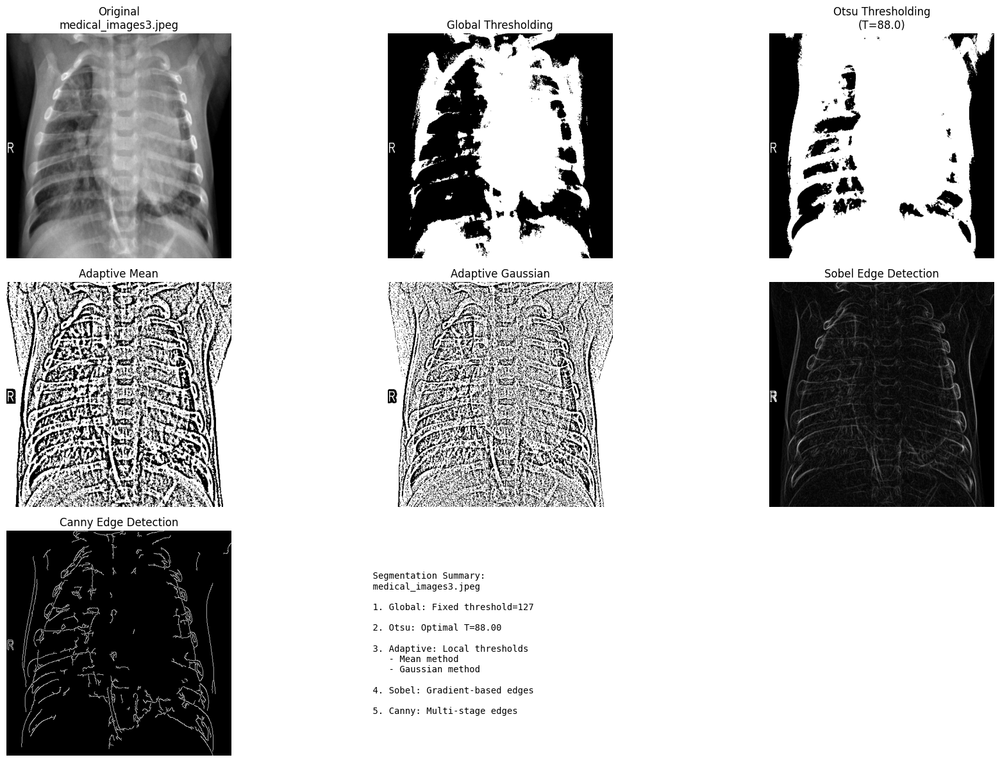


Comparison complete for all 3 medical images


In [ ]:
# Compare all segmentation techniques for each medical image
for idx, (img, name) in enumerate(zip(medical_images, image_names)):
    plt.figure(figsize=(24, 16))
    
    plt.subplot(3, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original\n{name}')
    plt.axis('off')
    
    plt.subplot(3, 3, 2)
    plt.imshow(global_thresh_results[idx], cmap='gray')
    plt.title('Global Thresholding')
    plt.axis('off')
    
    plt.subplot(3, 3, 3)
    plt.imshow(otsu_thresh_results[idx], cmap='gray')
    plt.title(f'Otsu Thresholding\n(T={otsu_thresholds[idx]:.1f})')
    plt.axis('off')
    
    plt.subplot(3, 3, 4)
    plt.imshow(adaptive_thresh_results[idx]['mean'], cmap='gray')
    plt.title('Adaptive Mean')
    plt.axis('off')
    
    plt.subplot(3, 3, 5)
    plt.imshow(adaptive_thresh_results[idx]['gaussian'], cmap='gray')
    plt.title('Adaptive Gaussian')
    plt.axis('off')
    
    plt.subplot(3, 3, 6)
    plt.imshow(sobel_results[idx]['combined'], cmap='gray')
    plt.title('Sobel Edge Detection')
    plt.axis('off')
    
    plt.subplot(3, 3, 7)
    plt.imshow(canny_results[idx]['medium'], cmap='gray')
    plt.title('Canny Edge Detection')
    plt.axis('off')
    
    plt.subplot(3, 3, 8)
    # Create a summary text
    summary_text = f"""
    Segmentation Summary:
    {name}
    
    1. Global: Fixed threshold={threshold_value}
    
    2. Otsu: Optimal T={otsu_thresholds[idx]:.2f}
    
    3. Adaptive: Local thresholds
       - Mean method
       - Gaussian method
    
    4. Sobel: Gradient-based edges
    
    5. Canny: Multi-stage edges
    """
    plt.text(0.1, 0.5, summary_text, fontsize=10, verticalalignment='center', family='monospace')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print(f"\nComparison complete for all {num_images} medical images")

## Using with Real Images

To use these techniques with your own images, replace the sample image creation code with:

In [51]:
# Example: Load your own image
# Uncomment and modify the path to use your own image

# image_path = 'path/to/your/image.jpg'
# image_real = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
# 
# if image_real is None:
#     print(f"Error: Could not load image from {image_path}")
# else:
#     # Apply all techniques to the real image
#     # Global thresholding
#     _, global_thresh_real = cv2.threshold(image_real, 127, 255, cv2.THRESH_BINARY)
#     
#     # Otsu thresholding
#     _, otsu_thresh_real = cv2.threshold(image_real, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
#     
#     # Sobel edge detection
#     sobel_x_real = cv2.Sobel(image_real, cv2.CV_64F, 1, 0, ksize=3)
#     sobel_y_real = cv2.Sobel(image_real, cv2.CV_64F, 0, 1, ksize=3)
#     sobel_real = cv2.convertScaleAbs(cv2.addWeighted(cv2.convertScaleAbs(sobel_x_real), 0.5, 
#                                                       cv2.convertScaleAbs(sobel_y_real), 0.5, 0))
#     
#     # Canny edge detection
#     canny_real = cv2.Canny(image_real, 50, 150)
#     
#     # Display results
#     plt.figure(figsize=(15, 10))
#     
#     plt.subplot(2, 3, 1)
#     plt.imshow(image_real, cmap='gray')
#     plt.title('Original Real Image')
#     plt.axis('off')
#     
#     plt.subplot(2, 3, 2)
#     plt.imshow(global_thresh_real, cmap='gray')
#     plt.title('Global Thresholding')
#     plt.axis('off')
#     
#     plt.subplot(2, 3, 3)
#     plt.imshow(otsu_thresh_real, cmap='gray')
#     plt.title('Otsu Thresholding')
#     plt.axis('off')
#     
#     plt.subplot(2, 3, 4)
#     plt.imshow(sobel_real, cmap='gray')
#     plt.title('Sobel Edge Detection')
#     plt.axis('off')
#     
#     plt.subplot(2, 3, 5)
#     plt.imshow(canny_real, cmap='gray')
#     plt.title('Canny Edge Detection')
#     plt.axis('off')
#     
#     plt.tight_layout()
#     plt.show()

print("To use with your own images, uncomment the code above and provide the image path.")

To use with your own images, uncomment the code above and provide the image path.
